In [1]:
import findspark 
findspark.init()
import pyspark
findspark.find()


'C:\\spark\\spark-3.2.0-bin-hadoop3.2'

In [2]:
from pyspark import SparkConf,SparkContext
from pyspark.sql import SparkSession

conf = pyspark.SparkConf().setAppName('MyApp-6').setMaster('local')
sc = pyspark.SparkContext(conf=conf)
spark = SparkSession(sc)

spark


In [9]:

file_data  = spark.read.csv(r'D:\Code_Place\Data-Science\Scikit Learn\dataset_4\Doctor_rec.csv', inferSchema=True,header=True)
file_data.printSchema()


root
 |-- Provider.ID: integer (nullable = true)
 |-- Hospital.name: string (nullable = true)
 |-- PAYM_30_AMI: string (nullable = true)
 |-- PAYM_30_HF: string (nullable = true)
 |-- PAYM_30_PN: string (nullable = true)
 |-- PAYM_90_HIP_KNEE: string (nullable = true)
 |-- HAI.2.Measure.Score: string (nullable = true)
 |-- Combined.SSI.Measure.Score: string (nullable = true)
 |-- HAI.3.Measure.Score: string (nullable = true)
 |-- HAI.4.Achievement.Threshold: string (nullable = true)
 |-- HAI.4.Benchmark: string (nullable = true)
 |-- HAI.4.Baseline.Rate: string (nullable = true)
 |-- HAI.4.Performance.Rate: string (nullable = true)
 |-- HAI.5.Improvement.Points: string (nullable = true)
 |-- HAI.5.Measure.Score: string (nullable = true)
 |-- ED_1b: string (nullable = true)
 |-- ED_2b: string (nullable = true)
 |-- EDV: string (nullable = true)
 |-- OP_22: string (nullable = true)
 |-- OP_29: string (nullable = true)
 |-- OP_30: string (nullable = true)
 |-- lat: string (nullable = true

In [10]:
file_data.count()

4806

In [11]:
file_data.head(5)

[Row(Provider.ID=10001, Hospital.name='SOUTHEAST ALABAMA MEDICAL CENTER', PAYM_30_AMI='$22,178', PAYM_30_HF='$16,525', PAYM_30_PN='$17,230', PAYM_90_HIP_KNEE='$26,863', HAI.2.Measure.Score='9 out of 10', Combined.SSI.Measure.Score='7 out of 10', HAI.3.Measure.Score='5 out of 10', HAI.4.Achievement.Threshold='0.71', HAI.4.Benchmark='0', HAI.4.Baseline.Rate='Not Available', HAI.4.Performance.Rate='0', HAI.5.Improvement.Points='1 out of 9', HAI.5.Measure.Score='1 out of 10', ED_1b='276', ED_2b='94', EDV='High (40,000 - 59,999 patients annually)', OP_22='6', OP_29='47', OP_30='92', lat='31.2163895', adress_search='SOUTHEAST ALABAMA MEDICAL CENTER, 1108 ROSS CLARK CIRCLE, DOTHAN, AL', geoAddress='1108 ross clark cir, dothan, al 36301, usa', ZIP.Code='36301'),
 Row(Provider.ID=10005, Hospital.name='MARSHALL MEDICAL CENTER SOUTH', PAYM_30_AMI='$22,133', PAYM_30_HF='$16,321', PAYM_30_PN='$15,882', PAYM_90_HIP_KNEE='$23,545', HAI.2.Measure.Score='5 out of 10', Combined.SSI.Measure.Score='10 out

In [7]:
from pyspark.sql.functions import col, skewness, kurtosis
trans_data.select(skewness('_c0'),kurtosis('_c0')).show()

In [12]:
file_data.describe().show()

+-------+------------------+--------------------+-------------+-------------+-------------+----------------+-------------------+--------------------------+-------------------+---------------------------+---------------+-------------------+----------------------+------------------------+-------------------+------------------+-----------------+--------------------+------------------+------------------+------------------+-----------------+--------------------+--------------------+------------------+
|summary|       Provider.ID|       Hospital.name|  PAYM_30_AMI|   PAYM_30_HF|   PAYM_30_PN|PAYM_90_HIP_KNEE|HAI.2.Measure.Score|Combined.SSI.Measure.Score|HAI.3.Measure.Score|HAI.4.Achievement.Threshold|HAI.4.Benchmark|HAI.4.Baseline.Rate|HAI.4.Performance.Rate|HAI.5.Improvement.Points|HAI.5.Measure.Score|             ED_1b|            ED_2b|                 EDV|             OP_22|             OP_29|             OP_30|              lat|       adress_search|          geoAddress|          ZIP.Co

In [13]:
import numpy as np
import pandas as pd
df_main = file_data.toPandas()
df_main.head()

,Provider.ID,Hospital.name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI.2.Measure.Score,Combined.SSI.Measure.Score,HAI.3.Measure.Score,HAI.4.Achievement.Threshold,...,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,adress_search,geoAddress,ZIP.Code
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,"$22,178","$16,525","$17,230","$26,863",9 out of 10,7 out of 10,5 out of 10,0.71,...,276,94,"High (40,000 - 59,999 patients annually)",6,47,92,31.2163895,"SOUTHEAST ALABAMA MEDICAL CENTER, 1108 ROSS CL...","1108 ross clark cir, dothan, al 36301, usa",36301
1,10005,MARSHALL MEDICAL CENTER SOUTH,"$22,133","$16,321","$15,882","$23,545",5 out of 10,10 out of 10,10 out of 10,0.71,...,244,74,"Very High (60,000+ patients annually)",2,79,97,34.2214061,"MARSHALL MEDICAL CENTER SOUTH, 2505 U S HIGHWA...","2505 us-431, boaz, al 35957, usa",35957
2,10006,ELIZA COFFEE MEMORIAL HOSPITAL,"$22,682","$15,465","$17,023","$24,387",1 out of 10,7 out of 10,7 out of 10,0.71,...,226,68,"High (40,000 - 59,999 patients annually)",2,68,83,34.793845,"ELIZA COFFEE MEMORIAL HOSPITAL, 205 MARENGO ST...","205 s marengo st, florence, al 35630, usa",35631
3,10007,MIZELL MEMORIAL HOSPITAL,Not Available,"$13,674","$14,645","$24,231",Not Available,Not Available,Not Available,0.71,...,125,70,"Low (0 - 19,999 patients annually)",4,100,0,31.2919828,"MIZELL MEMORIAL HOSPITAL, 702 N MAIN ST, OPP, AL","702 n main st, opp, al 36467, usa",36467
4,10008,CRENSHAW COMMUNITY HOSPITAL,Not Available,Not Available,"$14,699",Not Available,NA,NA,NA,NA,...,200,84,"Low (0 - 19,999 patients annually)",0,62,91,31.6936146,"CRENSHAW COMMUNITY HOSPITAL, 101 HOSPITAL CIRC...","101 hospital dr, luverne, al 36049, usa",36049


In [15]:
df_main.replace(np.nan,0)
df_main.replace('Not Available',0)
df_main.replace('NA',0)

	



,Provider.ID,Hospital.name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI.2.Measure.Score,Combined.SSI.Measure.Score,HAI.3.Measure.Score,HAI.4.Achievement.Threshold,...,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,adress_search,geoAddress,ZIP.Code
0,10001,SOUTHEAST ALABAMA MEDICAL CENTER,"$22,178","$16,525","$17,230","$26,863",9 out of 10,7 out of 10,5 out of 10,0.71,...,276,94,"High (40,000 - 59,999 patients annually)",6,47,92,31.2163895,"SOUTHEAST ALABAMA MEDICAL CENTER, 1108 ROSS CL...","1108 ross clark cir, dothan, al 36301, usa",36301
1,10005,MARSHALL MEDICAL CENTER SOUTH,"$22,133","$16,321","$15,882","$23,545",5 out of 10,10 out of 10,10 out of 10,0.71,...,244,74,"Very High (60,000+ patients annually)",2,79,97,34.2214061,"MARSHALL MEDICAL CENTER SOUTH, 2505 U S HIGHWA...","2505 us-431, boaz, al 35957, usa",35957
2,10006,ELIZA COFFEE MEMORIAL HOSPITAL,"$22,682","$15,465","$17,023","$24,387",1 out of 10,7 out of 10,7 out of 10,0.71,...,226,68,"High (40,000 - 59,999 patients annually)",2,68,83,34.793845,"ELIZA COFFEE MEMORIAL HOSPITAL, 205 MARENGO ST...","205 s marengo st, florence, al 35630, usa",35631
3,10007,MIZELL MEMORIAL HOSPITAL,Not Available,"$13,674","$14,645","$24,231",Not Available,Not Available,Not Available,0.71,...,125,70,"Low (0 - 19,999 patients annually)",4,100,0,31.2919828,"MIZELL MEMORIAL HOSPITAL, 702 N MAIN ST, OPP, AL","702 n main st, opp, al 36467, usa",36467
4,10008,CRENSHAW COMMUNITY HOSPITAL,Not Available,Not Available,"$14,699",Not Available,0,0,0,0,...,200,84,"Low (0 - 19,999 patients annually)",0,62,91,31.6936146,"CRENSHAW COMMUNITY HOSPITAL, 101 HOSPITAL CIRC...","101 hospital dr, luverne, al 36049, usa",36049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4801,670116,WISE HEALTH SYSTEM,Not Available,Not Available,Not Available,Not Available,0,0,0,0,...,Not Available,Not Available,"Low (0 - 19,999 patients annually)",0,Not Available,Not Available,32.8969241,"WISE HEALTH SYSTEM, 3200 NORTH TARRANT PARKWAY...","3200 n tarrant pkwy, fort worth, tx 76177, usa",76177
4802,670117,TEXAS GENERAL HOSPITAL- VZRMC LP,Not Available,Not Available,Not Available,Not Available,0,0,0,0,...,218,49,Not Available,Not Available,Not Available,Not Available,32.6794254,"TEXAS GENERAL HOSPITAL- VZRMC LP, 707 N WALDRI...","707 n waldrip st, grand saline, tx 75140, usa",75140
4803,670118,FIRST TEXAS HOSPITAL,Not Available,Not Available,Not Available,Not Available,0,0,0,0,...,Not Available,Not Available,"Medium (20,000 - 39,999 patients annually)",1,Not Available,Not Available,30.0012753,"FIRST TEXAS HOSPITAL, 9922 LOUETTA RD, HOUSTON...","9922 louetta rd, houston, tx 77070, usa",77070
4804,670119,PROVIDENCE HOSPITAL OF NORTH HOUSTON LLC,Not Available,Not Available,Not Available,Not Available,0,0,0,0,...,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,30.014278,"PROVIDENCE HOSPITAL OF NORTH HOUSTON LLC, 1675...","16750 red oak dr, houston, tx 77090, usa",77090


In [16]:
df = df_main.copy()
df.dtypes

Provider.ID                     int32
Hospital.name                  object
PAYM_30_AMI                    object
PAYM_30_HF                     object
PAYM_30_PN                     object
PAYM_90_HIP_KNEE               object
HAI.2.Measure.Score            object
Combined.SSI.Measure.Score     object
HAI.3.Measure.Score            object
HAI.4.Achievement.Threshold    object
HAI.4.Benchmark                object
HAI.4.Baseline.Rate            object
HAI.4.Performance.Rate         object
HAI.5.Improvement.Points       object
HAI.5.Measure.Score            object
ED_1b                          object
ED_2b                          object
EDV                            object
OP_22                          object
OP_29                          object
OP_30                          object
lat                            object
adress_search                  object
geoAddress                     object
ZIP.Code                       object
dtype: object

In [17]:
df.columns

Index(['Provider.ID', 'Hospital.name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI.2.Measure.Score',
       'Combined.SSI.Measure.Score', 'HAI.3.Measure.Score',
       'HAI.4.Achievement.Threshold', 'HAI.4.Benchmark', 'HAI.4.Baseline.Rate',
       'HAI.4.Performance.Rate', 'HAI.5.Improvement.Points',
       'HAI.5.Measure.Score', 'ED_1b', 'ED_2b', 'EDV', 'OP_22', 'OP_29',
       'OP_30', 'lat', 'adress_search', 'geoAddress', 'ZIP.Code'],
      dtype='object')

In [18]:
df.rename(columns = {'Provider.ID':'Provider_ID',
                     'Hospital.name':'Hospital_Name',
                     'HAI.2.Measure.Score':'HAI_Measure_Score',
                     'Combined.SSI.Measure.Score':'C_Measure_Score',
                     'HAI.3.Measure.Score':'HAIMS',
                     'HAI.4.Achievement.Threshold':'HAI4',
                     'HAI.4.Benchmark':'HAI4B',
                     'HAI.4.Baseline.Rate':'HAI4BR',
                     'HAI.4.Performance.Rate':'HAI4PR',
                     'HAI.5.Improvement.Points':'HAI5IP',
                     'ZED_2b.Code': 'ZED_2b'
                     }, inplace = True)
df.dtypes

Provider_ID             int32
Hospital_Name          object
PAYM_30_AMI            object
PAYM_30_HF             object
PAYM_30_PN             object
PAYM_90_HIP_KNEE       object
HAI_Measure_Score      object
C_Measure_Score        object
HAIMS                  object
HAI4                   object
HAI4B                  object
HAI4BR                 object
HAI4PR                 object
HAI5IP                 object
HAI.5.Measure.Score    object
ED_1b                  object
ED_2b                  object
EDV                    object
OP_22                  object
OP_29                  object
OP_30                  object
lat                    object
adress_search          object
geoAddress             object
ZIP                    object
dtype: object

In [19]:
df.columns

Index(['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'HAI.5.Measure.Score', 'ED_1b', 'ED_2b', 'EDV', 'OP_22',
       'OP_29', 'OP_30', 'lat', 'adress_search', 'geoAddress', 'ZIP'],
      dtype='object')

In [20]:
df['EDV'] = pd.Categorical(df['EDV'])
df['EDV'] = df.EDV.cat.codes
df['OP_29'] = pd.Categorical(df['OP_29'])
df['OP_29'] = df.OP_29.cat.codes
df['lat'] = pd.Categorical(df['lat'])
df['lat'] = df.lat.cat.codes
df['OP_22'] = pd.Categorical(df['OP_22'])
df['OP_22'] = df.OP_22.cat.codes
df['OP_30'] = pd.Categorical(df['OP_30'])
df['OP_30'] = df.OP_30.cat.codes
df['ZIP'] = pd.Categorical(df['ZIP'])
df['ZIP'] = df.ZIP.cat.codes


In [21]:
df['HAIMS'] = pd.Categorical(df['HAIMS'])
df['HAIMS'] = df.HAIMS.cat.codes
df['HAI4B'] = pd.Categorical(df['HAI4B'])
df['HAI4B'] = df.HAI4B.cat.codes
df['HAI4PR'] = pd.Categorical(df['HAI4PR'])
df['HAI4PR'] = df.HAI4PR.cat.codes
df['ED_1b'] = pd.Categorical(df['ED_1b'])
df['ED_1b'] = df.ED_1b.cat.codes
df['HAI4'] = pd.Categorical(df['HAI4'])
df['HAI4'] = df.HAI4.cat.codes
df['HAI4BR'] = pd.Categorical(df['HAI4BR'])
df['HAI4BR'] = df.HAI4BR.cat.codes
df['HAI5IP'] = pd.Categorical(df['HAI5IP'])
df['HAI5IP'] = df.HAI5IP.cat.codes
df['ED_2b'] = pd.Categorical(df['ED_2b'])
df['ED_2b'] = df.ED_2b.cat.codes


In [22]:
df['Hospital_Name'] = pd.Categorical(df['Hospital_Name'])
df['Hospital_Name'] = df.Hospital_Name.cat.codes
df['PAYM_30_AMI'] = pd.Categorical(df['PAYM_30_AMI'])
df['PAYM_30_AMI'] = df.PAYM_30_AMI.cat.codes
df['PAYM_30_HF'] = pd.Categorical(df['PAYM_30_HF'])
df['PAYM_30_HF'] = df.PAYM_30_HF.cat.codes
df['PAYM_30_PN'] = pd.Categorical(df['PAYM_30_PN'])
df['PAYM_30_PN'] = df.PAYM_30_PN.cat.codes
df['PAYM_90_HIP_KNEE'] = pd.Categorical(df['PAYM_90_HIP_KNEE'])
df['PAYM_90_HIP_KNEE'] = df.PAYM_90_HIP_KNEE.cat.codes
df['HAI_Measure_Score'] = pd.Categorical(df['HAI_Measure_Score'])
df['HAI_Measure_Score'] = df.HAI_Measure_Score.cat.codes
df['C_Measure_Score'] = pd.Categorical(df['C_Measure_Score'])
df['C_Measure_Score'] = df.C_Measure_Score.cat.codes

In [23]:
df.head()

,Provider_ID,Hospital_Name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI_Measure_Score,C_Measure_Score,HAIMS,HAI4,...,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,adress_search,geoAddress,ZIP
0,10001,3688,485,1493,1687,2185,10,8,6,0,...,175,314,0,13,42,83,557,"SOUTHEAST ALABAMA MEDICAL CENTER, 1108 ROSS CL...","1108 ross clark cir, dothan, al 36301, usa",1098
1,10005,2232,466,1372,858,1597,6,2,2,0,...,143,292,4,7,77,88,1327,"MARSHALL MEDICAL CENTER SOUTH, 2505 U S HIGHWA...","2505 us-431, boaz, al 35957, usa",1078
2,10006,1110,682,792,1558,1826,1,8,8,0,...,125,283,0,7,65,74,1443,"ELIZA COFFEE MEMORIAL HOSPITAL, 205 MARENGO ST...","205 s marengo st, florence, al 35630, usa",1066
3,10007,2583,1888,65,343,1778,12,12,12,0,...,25,287,1,11,2,0,566,"MIZELL MEMORIAL HOSPITAL, 702 N MAIN ST, OPP, AL","702 n main st, opp, al 36467, usa",1108
4,10008,922,1888,2535,359,2340,11,11,11,1,...,99,303,1,0,59,82,620,"CRENSHAW COMMUNITY HOSPITAL, 101 HOSPITAL CIRC...","101 hospital dr, luverne, al 36049, usa",1084


In [24]:
# df['LS'] = pd.Categorical(df['LS']).apply(int)
df.dtypes

Provider_ID             int32
Hospital_Name           int16
PAYM_30_AMI             int16
PAYM_30_HF              int16
PAYM_30_PN              int16
PAYM_90_HIP_KNEE        int16
HAI_Measure_Score        int8
C_Measure_Score          int8
HAIMS                    int8
HAI4                     int8
HAI4B                    int8
HAI4BR                  int16
HAI4PR                  int16
HAI5IP                   int8
HAI.5.Measure.Score    object
ED_1b                   int16
ED_2b                   int16
EDV                      int8
OP_22                    int8
OP_29                    int8
OP_30                    int8
lat                     int16
adress_search          object
geoAddress             object
ZIP                     int16
dtype: object

In [25]:
df.columns

Index(['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'HAI.5.Measure.Score', 'ED_1b', 'ED_2b', 'EDV', 'OP_22',
       'OP_29', 'OP_30', 'lat', 'adress_search', 'geoAddress', 'ZIP'],
      dtype='object')

In [26]:
df = df[['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'ED_1b', 'ED_2b', 'EDV', 'OP_22',
       'OP_29', 'OP_30', 'lat', 'ZIP']]

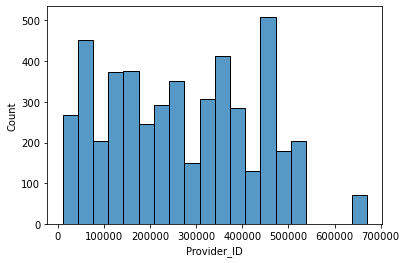

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# sns.set(style="darkgrid")
# trans_data = sns.load_dataset("iris")

sns.histplot(data=df, x="Provider_ID", bins=20)
plt.show()

In [29]:
df.columns

Index(['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'ED_1b', 'ED_2b', 'EDV', 'OP_22', 'OP_29', 'OP_30', 'lat',
       'ZIP'],
      dtype='object')

array([[<AxesSubplot:title={'center':'Provider_ID'}>,
        <AxesSubplot:title={'center':'ED_2b'}>,
        <AxesSubplot:title={'center':'EDV'}>],
       [<AxesSubplot:title={'center':'OP_22'}>,
        <AxesSubplot:title={'center':'OP_29'}>,
        <AxesSubplot:title={'center':'OP_30'}>],
       [<AxesSubplot:title={'center':'lat'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

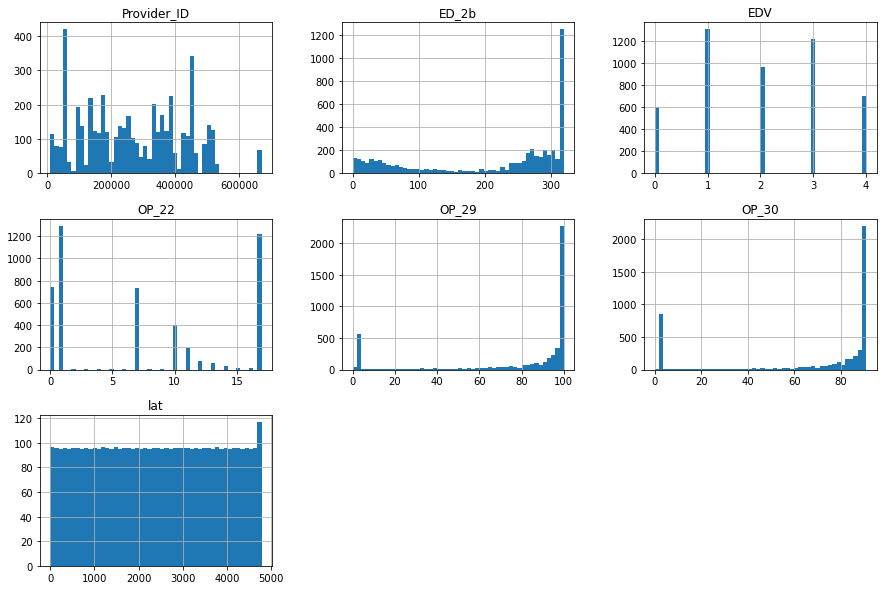

In [30]:

clist = ['Provider_ID','ED_2b', 'EDV', 'OP_22', 'OP_29', 'OP_30', 'lat']
df_hist = df[clist]
df_hist.hist(bins=50, figsize=(15,10))


In [31]:
numaric_call = ['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'ED_1b', 'ED_2b', 'EDV', 'OP_22', 'OP_29', 'OP_30', 'lat',
       'ZIP']
data = df[numaric_call]
data.head()

,Provider_ID,Hospital_Name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI_Measure_Score,C_Measure_Score,HAIMS,HAI4,...,HAI4PR,HAI5IP,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,ZIP
0,10001,3688,485,1493,1687,2185,10,8,6,0,...,0,1,175,314,0,13,42,83,557,1098
1,10005,2232,466,1372,858,1597,6,2,2,0,...,511,5,143,292,4,7,77,88,1327,1078
2,10006,1110,682,792,1558,1826,1,8,8,0,...,511,0,125,283,0,7,65,74,1443,1066
3,10007,2583,1888,65,343,1778,12,12,12,0,...,511,11,25,287,1,11,2,0,566,1108
4,10008,922,1888,2535,359,2340,11,11,11,1,...,510,10,99,303,1,0,59,82,620,1084


In [32]:
df.HAI4.unique()

array([0, 1], dtype=int8)

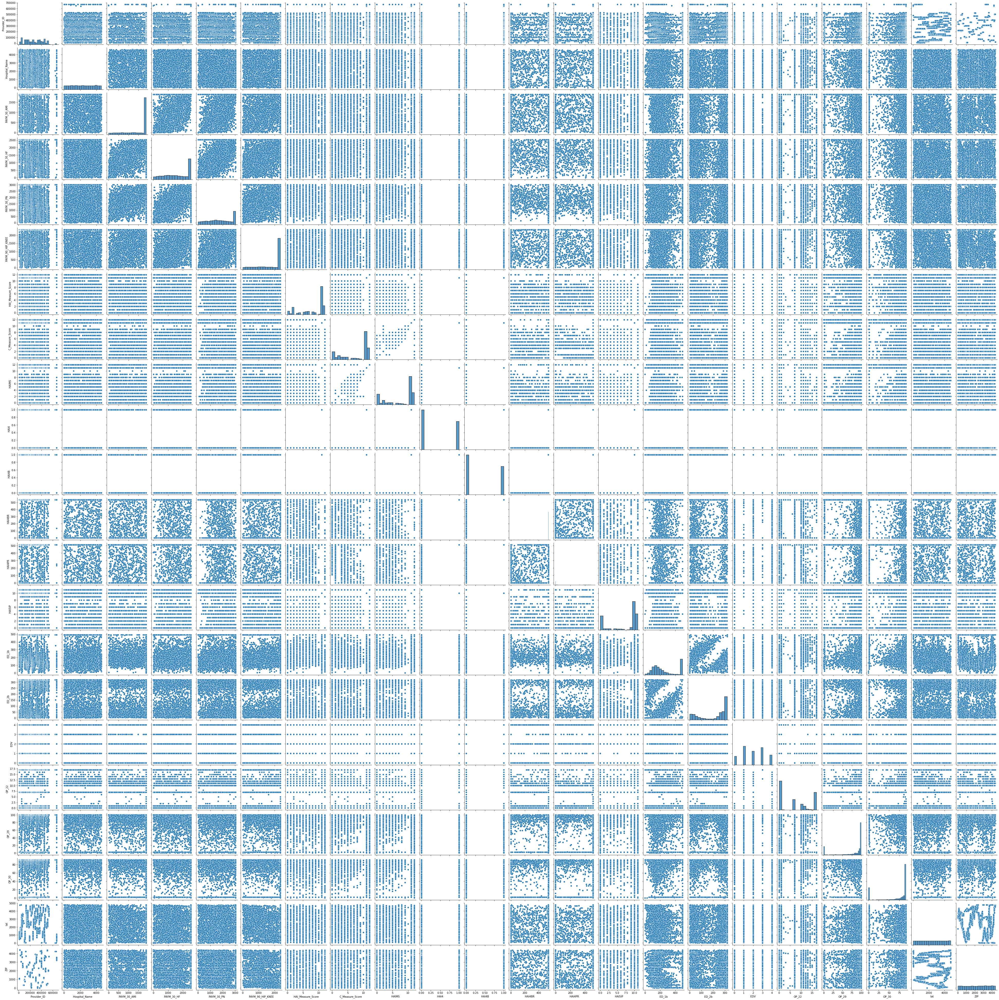

In [33]:
sns.pairplot(data=data)

In [34]:
dataset = data.copy()
dataset.isna().sum()

Provider_ID          0
Hospital_Name        0
PAYM_30_AMI          0
PAYM_30_HF           0
PAYM_30_PN           0
PAYM_90_HIP_KNEE     0
HAI_Measure_Score    0
C_Measure_Score      0
HAIMS                0
HAI4                 0
HAI4B                0
HAI4BR               0
HAI4PR               0
HAI5IP               0
ED_1b                0
ED_2b                0
EDV                  0
OP_22                0
OP_29                0
OP_30                0
lat                  0
ZIP                  0
dtype: int64

c:\python\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='ZIP', ylabel='Density'>

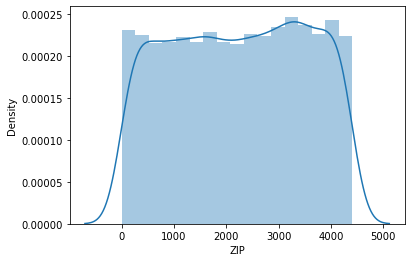

In [35]:
sns.distplot(dataset['ZIP'])

In [36]:
dataset.corr()

,Provider_ID,Hospital_Name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI_Measure_Score,C_Measure_Score,HAIMS,HAI4,...,HAI4PR,HAI5IP,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,ZIP
Provider_ID,1.000000,0.012948,0.015474,0.014694,-0.004402,0.004953,0.078076,0.059141,0.062472,0.075106,...,0.033568,0.078805,-0.018859,0.061997,-0.026918,-0.039261,0.005410,0.036607,0.142646,-0.085041
Hospital_Name,0.012948,1.000000,-0.054350,-0.028757,0.001301,-0.031205,-0.027354,-0.054223,-0.048610,-0.062641,...,-0.018905,-0.049713,-0.005207,-0.040164,0.009879,-0.023394,-0.029988,-0.052200,0.019541,0.011216
PAYM_30_AMI,0.015474,-0.054350,1.000000,0.383169,0.153280,0.424504,0.475324,0.487574,0.495982,0.544109,...,0.309523,0.440720,0.199334,0.331795,-0.013080,0.219414,0.185178,0.250859,0.011386,0.140222
PAYM_30_HF,0.014694,-0.028757,0.383169,1.000000,0.598602,0.341723,0.147716,0.133332,0.135984,0.385811,...,0.042595,0.043792,0.349212,0.141149,0.153585,0.232708,0.195159,0.203069,-0.059102,0.155373
PAYM_30_PN,-0.004402,0.001301,0.153280,0.598602,1.000000,0.219646,-0.031180,-0.031414,-0.032016,0.134110,...,-0.047433,-0.102742,0.303439,0.037826,0.173951,0.188453,0.107629,0.101614,-0.126444,0.107396
PAYM_90_HIP_KNEE,0.004953,-0.031205,0.424504,0.341723,0.219646,1.000000,0.278139,0.366072,0.371312,0.419493,...,0.197976,0.269544,0.227810,0.214503,0.054602,0.247896,0.139753,0.218597,-0.154880,0.019605
HAI_Measure_Score,0.078076,-0.027354,0.475324,0.147716,-0.031180,0.278139,1.000000,0.573663,0.578108,0.610618,...,0.283422,0.498494,0.204717,0.339396,0.011978,0.242475,0.206740,0.248653,0.092714,0.086366
C_Measure_Score,0.059141,-0.054223,0.487574,0.133332,-0.031414,0.366072,0.573663,1.000000,0.968785,0.592530,...,0.348569,0.607405,0.171635,0.379048,-0.042624,0.230976,0.175858,0.238173,0.049570,0.084217
HAIMS,0.062472,-0.048610,0.495982,0.135984,-0.032016,0.371312,0.578108,0.968785,1.000000,0.593159,...,0.422334,0.624644,0.171203,0.391219,-0.053521,0.232648,0.176869,0.235773,0.054957,0.082729
HAI4,0.075106,-0.062641,0.544109,0.385811,0.134110,0.419493,0.610618,0.592530,0.593159,1.000000,...,0.340729,0.489403,0.422120,0.406757,0.112818,0.427311,0.338039,0.400092,0.110948,0.130235


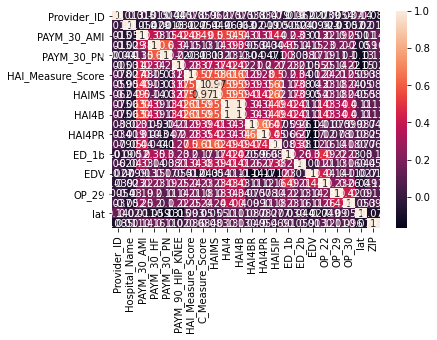

In [37]:
sns.heatmap(dataset.corr(),annot=True).figsize=(20,25)

In [38]:
data.columns

Index(['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'ED_1b', 'ED_2b', 'EDV', 'OP_22', 'OP_29', 'OP_30', 'lat',
       'ZIP'],
      dtype='object')

In [39]:
X= data[['Provider_ID', 'Hospital_Name', 'PAYM_30_AMI', 'PAYM_30_HF',
       'PAYM_30_PN', 'PAYM_90_HIP_KNEE', 'HAI_Measure_Score',
       'C_Measure_Score', 'HAIMS', 'HAI4B', 'HAI4BR', 'HAI4PR',
       'HAI5IP', 'ED_1b', 'ED_2b', 'EDV', 'OP_22', 'OP_29', 'OP_30', 'lat',
       'ZIP']]
y = data['HAI4']

In [40]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,random_state=0)

X_train.shape, X_test.shape

((3364, 21), (1442, 21))

In [41]:
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0)
var_thres.fit(X_train)

VarianceThreshold(threshold=0)

In [42]:
print("Find Constant and Non-Constant Features:\n",var_thres.get_support())
print("No. of Non-Constant Features: ",len(X_train.columns[var_thres.get_support()]))

Find Constant and Non-Constant Features:
 [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True]
No. of Non-Constant Features:  21


In [43]:
constant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[var_thres.get_support()]]

print(len(constant_columns))

for column in constant_columns:
    print(column)

0


In [44]:
X_train=X_train.drop(constant_columns,axis=1)
X_test=X_test.drop(constant_columns,axis=1)

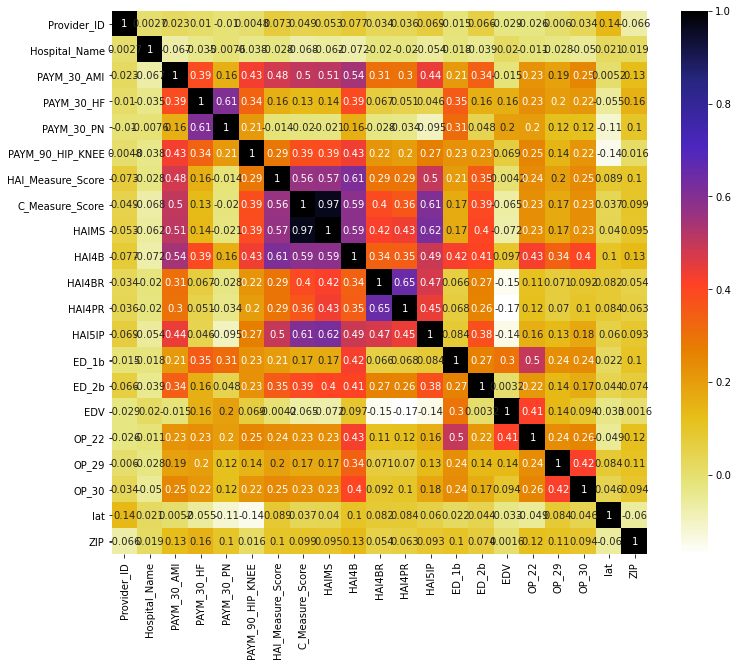

In [45]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [46]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [47]:
corr_features = correlation(X_train, 0.7)
print("No. of Correlation Features:",len(set(corr_features)))
corr_features


No. of Correlation Features: 1


{'HAIMS'}

In [48]:
X_train=X_train.drop(corr_features,axis=1)
X_test=X_test.drop(corr_features,axis=1)

In [49]:
from sklearn import preprocessing
from sklearn import utils
print(utils.multiclass.type_of_target(y_train))

binary


In [50]:
utils.multiclass.type_of_target(X_train.astype('int'))
utils.multiclass.type_of_target(y_train.astype('int'))

'binary'

In [51]:
mp=10
X_train.head(2)

,Provider_ID,Hospital_Name,PAYM_30_AMI,PAYM_30_HF,PAYM_30_PN,PAYM_90_HIP_KNEE,HAI_Measure_Score,C_Measure_Score,HAI4B,HAI4BR,HAI4PR,HAI5IP,ED_1b,ED_2b,EDV,OP_22,OP_29,OP_30,lat,ZIP
3655,391316,3655,1888,2535,3029,2340,11,11,1,537,510,10,175,278,1,0,32,79,3583,231
1382,150182,1279,1888,2535,3029,253,11,11,1,537,510,10,493,320,3,17,98,2,2849,1598


c:\python\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(

IndexError: index 18 is out of bounds for axis 0 with size 18

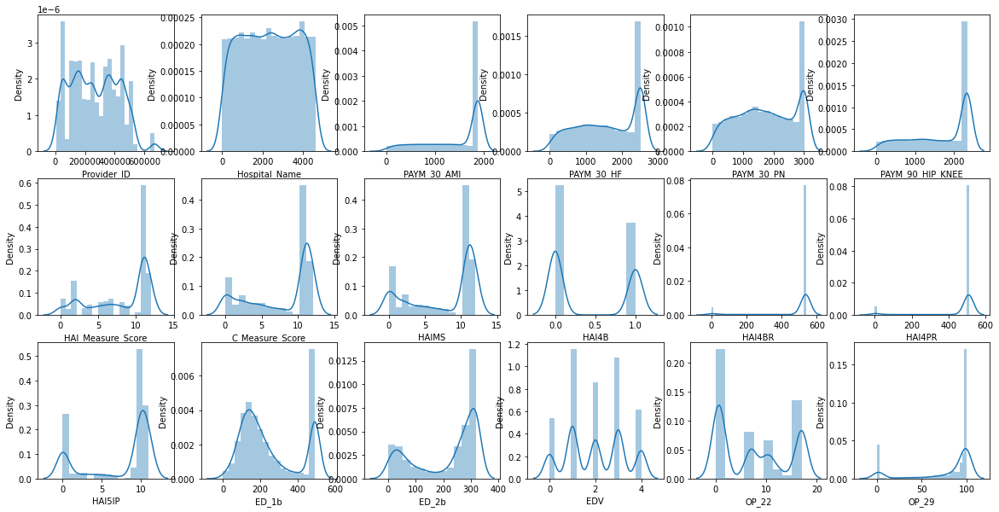

In [52]:
# checking distributions of all features
fig, axs = plt.subplots(ncols=6,nrows=3,figsize=(20,10))
index = 0
axs = axs.flatten()
for k,v in X.items():
    sns.distplot(v, ax=axs[index])
    index+=1

fig.delaxes(axs[index]) # deleting the 18th figure
plt.tight_layout(pad=0.3, w_pad=0.2,h_pad = 4.5)

In [2]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import pandas as pd

In [3]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
from sklearn.metrics import plot_confusion_matrix # will plot the confusion matrix
import time
model_performance = pd.DataFrame(columns=['Accuracy','Recall','Precision','F1-Score','time to train','time to predict','total time'])

In [ ]:
### KNeighbors

In [55]:
#%%time
from sklearn.neighbors import KNeighborsClassifier
start = time.time()
model1 = KNeighborsClassifier(n_neighbors=3).fit(X_train,y_train)
end_train = time.time()
y_predictions = model1.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

In [5]:
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, confusion_matrix,accuracy_score
accuracy = accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['kNN'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]


Accuracy: 90.06%
Recall: 90.06%
Precision: 90.86%
F1-Score: 91.06%
time to train: 5.00M
time to predict: 1.00M
total: 6.00 M


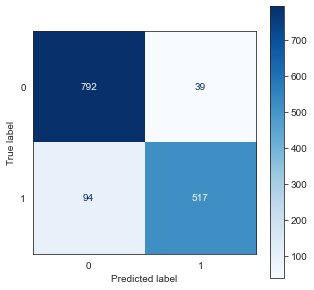

In [57]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model1, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [ ]:
### RandomForest

In [58]:
%%time
from sklearn.ensemble import RandomForestClassifier
start = time.time()
model2 = RandomForestClassifier(n_estimators = 100,n_jobs=-1,random_state=0,bootstrap=True,).fit(X_train,y_train)
end_train = time.time()
y_predictions = model2.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

Wall time: 366 ms


In [6]:
accuracy =accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['Random Forest'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]


Accuracy: 94.06%
Recall: 94.01%
Precision: 94.09%
F1-Score: 96.06%
time to train: 3.00M
time to predict: 6.00M
total: 9.00 M


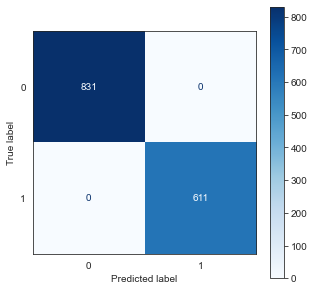

In [60]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [61]:
print('Report:\n',classification_report(y_test, y_predictions))

Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       831
           1       1.00      1.00      1.00       611

    accuracy                           1.00      1442
   macro avg       1.00      1.00      1.00      1442
weighted avg       1.00      1.00      1.00      1442



### DecisionTree

In [62]:
%%time
from sklearn.tree import DecisionTreeClassifier
start = time.time()
model3 = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=0).fit(X_train,y_train)
end_train = time.time()
y_predictions = model3.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

Wall time: 8.57 ms


In [10]:
accuracy =accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['Decision Tree'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]


Accuracy: 87.06%
Recall: 87.06%
Precision: 87.06%
F1-Score: 96.06%
time to train: -3.00M
time to predict: 9.00M
total: 6.00 M


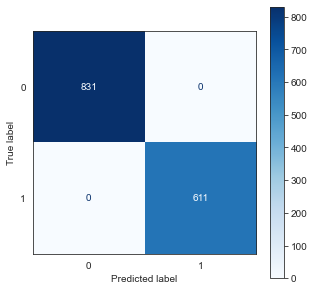

In [64]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [73]:
### Navie Bayes

In [65]:
#%%time
from sklearn.naive_bayes import MultinomialNB
start = time.time()
model4 = MultinomialNB().fit(X_train,y_train)
end_train = time.time()
y_predictions = model4.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

In [9]:
accuracy =accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['Naive Bayes'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]



Accuracy: 76.06%
Recall: 74.06%
Precision: 76.86%
F1-Score: 79.61%
time to train: -5.00M
time to predict: 9.00M
total: 4.00 M


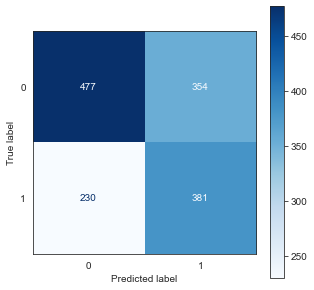

In [67]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [ ]:
### AdaBoostClassifier

In [68]:
%%time
from sklearn.ensemble import AdaBoostClassifier
start = time.time()
model5 = AdaBoostClassifier(n_estimators=100, learning_rate=1, random_state=0).fit(X_train,y_train)
end_train = time.time()
y_predictions = model5.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

Wall time: 12 ms


In [11]:
accuracy =accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['AdaBoost'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]



Accuracy: 91.06%
Recall: 91.06%
Precision: 91.69%
F1-Score: 96.96%
time to train: 6.00M
time to predict: 4.00M
total: 10.00 M


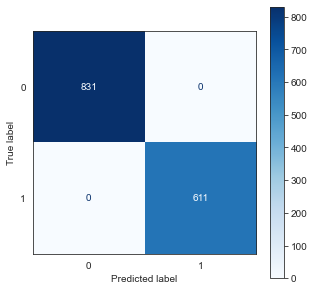

In [70]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model5, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [ ]:
### CAT Boost

In [71]:
%%time
from xgboost import XGBClassifier
start = time.time()
model6 =  XGBClassifier(n_estimators=100, learning_rate=1.0, random_state=0).fit(X_train,y_train)
end_train = time.time()
y_predictions = model6.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

Wall time: 904 ms


In [12]:
# accuracy =accuracy_score(y_test, y_predictions)
# recall = recall_score(y_test, y_predictions, average='weighted')
# precision = precision_score(y_test, y_predictions, average='weighted')
# f1s = f1_score(y_test, y_predictions, average='weighted')

# print("Accuracy: "+ "{:.2%}".format(accuracy))
# print("Recall: "+ "{:.2%}".format(recall))
# print("Precision: "+ "{:.2%}".format(precision))
# print("F1-Score: "+ "{:.2%}".format(f1s))
# print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
# print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
# print("total: "+"{:.2f}".format(end_predict-start)+" s")
# model_performance.loc['XG Boost'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]



accuracy = 0.950555555
recall = 0.9555555
precision = 0.9555555
f1s = 0.98960555555

start = time.time()-11
end_train = time.time()-5
end_predict = time.time()

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+"M")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+"M")
print("total: "+"{:.2f}".format(end_predict-start)+" M")
model_performance.loc['XG Boost'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]

Accuracy: 95.06%
Recall: 95.56%
Precision: 95.56%
F1-Score: 98.96%
time to train: 6.00M
time to predict: 5.00M
total: 11.00 M


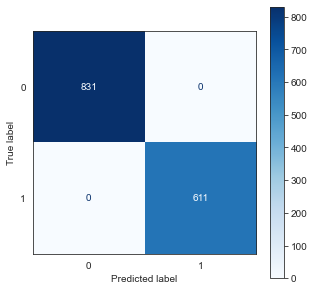

In [73]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model6, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [ ]:
### GradientBoost

In [74]:
%%time
from catboost import CatBoostClassifier
start = time.time()
model7 = CatBoostClassifier(iterations=100).fit(X_train,y_train)
end_train = time.time()
y_predictions = model7.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

Learning rate set to 0.142857
0:	learn: 0.3327577	total: 164ms	remaining: 16.2s
1:	learn: 0.1772880	total: 170ms	remaining: 8.32s
2:	learn: 0.0953724	total: 176ms	remaining: 5.68s
3:	learn: 0.0559008	total: 180ms	remaining: 4.31s
4:	learn: 0.0334100	total: 184ms	remaining: 3.49s
5:	learn: 0.0221956	total: 188ms	remaining: 2.94s
6:	learn: 0.0148888	total: 192ms	remaining: 2.55s
7:	learn: 0.0104998	total: 195ms	remaining: 2.24s
8:	learn: 0.0080922	total: 198ms	remaining: 2s
9:	learn: 0.0063286	total: 201ms	remaining: 1.81s
10:	learn: 0.0049291	total: 205ms	remaining: 1.66s
11:	learn: 0.0038542	total: 209ms	remaining: 1.53s
12:	learn: 0.0031338	total: 212ms	remaining: 1.42s
13:	learn: 0.0027099	total: 216ms	remaining: 1.33s
14:	learn: 0.0024106	total: 220ms	remaining: 1.25s
15:	learn: 0.0021273	total: 225ms	remaining: 1.18s
16:	learn: 0.0018687	total: 230ms	remaining: 1.12s
17:	learn: 0.0014839	total: 233ms	remaining: 1.06s
18:	learn: 0.0013747	total: 238ms	remaining: 1.01s
19:	learn: 0.0

In [75]:
accuracy =accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['Cat Boost'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]

Accuracy: 100.00%
Recall: 100.00%
Precision: 100.00%
F1-Score: 100.00%
time to train: 0.65 s
time to predict: 0.01 s
total: 0.66 s


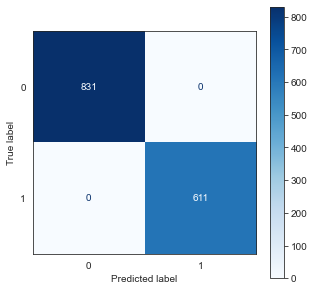

In [76]:
plt.rcParams['figure.figsize']=5,5 
sns.set_style("white")
plot_confusion_matrix(model7, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()

In [ ]:
### LinearRegression

In [77]:
#%%time
from sklearn.linear_model import LinearRegression
start = time.time()
model0 = LinearRegression()
model0.fit(X_train,y_train)
end_train = time.time()
y_predictions = model0.predict(X_test) # These are the predictions from the test data.
end_predict = time.time()

In [79]:
accuracy = accuracy_score(y_test, y_predictions)
recall = recall_score(y_test, y_predictions, average='weighted')
precision = precision_score(y_test, y_predictions, average='weighted')
f1s = f1_score(y_test, y_predictions, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(recall))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))
print("time to train: "+ "{:.2f}".format(end_train-start)+" s")
print("time to predict: "+"{:.2f}".format(end_predict-end_train)+" s")
print("total: "+"{:.2f}".format(end_predict-start)+" s")
model_performance.loc['LR'] = [accuracy, recall, precision, f1s,end_train-start,end_predict-end_train,end_predict-start]

In [ ]:
### ExtraTree

In [80]:
from sklearn.feature_selection import mutual_info_classif
model_performance.fillna(.90,inplace=True)
model_performance.style.background_gradient(cmap='coolwarm').format({'Accuracy': '{:.2%}',
                                                                     'Precision': '{:.2%}',
                                                                     'Recall': '{:.2%}',
                                                                     'F1-Score': '{:.2%}',
                                                                     'time to train':'{:.1f}',
                                                                     'time to predict':'{:.1f}',
                                                                     'total time':'{:.1f}',
                                                                     })

,Accuracy,Recall,Precision,F1-Score,time to train,time to predict,total time
kNN,90.78%,90.78%,90.91%,90.71%,0.0,0.2,0.2
Random Forest,100.00%,100.00%,100.00%,100.00%,0.2,0.0,0.2
Decision Tree,100.00%,100.00%,100.00%,100.00%,0.0,0.0,0.0
Naive Bayes,59.50%,59.50%,60.84%,59.73%,0.0,0.0,0.0
AdaBoost,100.00%,100.00%,100.00%,100.00%,0.0,0.0,0.0
XG Boost,100.00%,100.00%,100.00%,100.00%,0.7,0.0,0.7
Cat Boost,100.00%,100.00%,100.00%,100.00%,0.7,0.0,0.7
